In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import warnings
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns',None)



In [2]:
main_df = pd.read_csv("https://runestone.academy/ns/books/published/httlads/_static/un-general-debates.csv")

In [3]:
main_df.head()

,session,year,country,text
0,44,1989,MDV,﻿It is indeed a pleasure for me and the member...
1,44,1989,FIN,"﻿\nMay I begin by congratulating you. Sir, on ..."
2,44,1989,NER,"﻿\nMr. President, it is a particular pleasure ..."
3,44,1989,URY,﻿\nDuring the debate at the fortieth session o...
4,44,1989,ZWE,﻿I should like at the outset to express my del...


In [4]:
main_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7507 entries, 0 to 7506
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   session  7507 non-null   int64 
 1   year     7507 non-null   int64 
 2   country  7507 non-null   object
 3   text     7507 non-null   object
dtypes: int64(2), object(2)
memory usage: 234.7+ KB


In [5]:
main_df['year'].min()
#this  text year starts in 1970

np.int64(1970)

In [6]:
main_df['year'].max()
# this text year finish in 2015

np.int64(2015)

In [7]:
main_df.groupby('session')['year'].mean()

session
25    1970.0
26    1971.0
27    1972.0
28    1973.0
29    1974.0
30    1975.0
31    1976.0
32    1977.0
33    1978.0
34    1979.0
35    1980.0
36    1981.0
37    1982.0
38    1983.0
39    1984.0
40    1985.0
41    1986.0
42    1987.0
43    1988.0
44    1989.0
45    1990.0
46    1991.0
47    1992.0
48    1993.0
49    1994.0
50    1995.0
51    1996.0
52    1997.0
53    1998.0
54    1999.0
55    2000.0
56    2001.0
57    2002.0
58    2003.0
59    2004.0
60    2005.0
61    2006.0
62    2007.0
63    2008.0
64    2009.0
65    2010.0
66    2011.0
67    2012.0
68    2013.0
69    2014.0
70    2015.0
Name: year, dtype: float64

In [8]:
main_df.groupby('year')['session'].mean().sort_values().head()

year
1970    25.0
1971    26.0
1972    27.0
1973    28.0
1974    29.0
Name: session, dtype: float64

In [9]:
main_df['session'].nunique()
# 46 session in this data 

46

In [10]:
main_df['year'].nunique()

46

In [11]:
main_df['country'].nunique()
#199 country join the session

199

In [12]:
main_df['text']

0       ﻿It is indeed a pleasure for me and the member...
1       ﻿\nMay I begin by congratulating you. Sir, on ...
2       ﻿\nMr. President, it is a particular pleasure ...
3       ﻿\nDuring the debate at the fortieth session o...
4       ﻿I should like at the outset to express my del...
                              ...                        
7502    ﻿This session\nthat is taking place under extr...
7503    ﻿I am honoured to\nparticipate in this histori...
7504    ﻿It\nis for me a signal honour to take the flo...
7505    ﻿First, may I congratulate Mr. Han Seung-soo o...
7506    ﻿On behalf of the State of Kuwait, it\ngives m...
Name: text, Length: 7507, dtype: object

In [13]:
#print(repr("Hello\nWorld"))
#repr direkt ham halinin gozu
# 'Hello\nWorld'

In [14]:
print(repr(main_df['text'].iloc[100][0:400]))

'\ufeffIt gives me great pleasure, Sir, to offer you, on behalf of the Pakistan delegation, warm and sincere felicitations on your election as President of the Ganeral Assembly at its forty-fourth session. Your unanimous election was a tribute to you, as well as recognition of the important role played by Nigeria in promoting international peace, security and progress. Relations between our two countrie'


In [15]:
print((main_df['text'].iloc[100][0:400]))

It gives me great pleasure, Sir, to offer you, on behalf of the Pakistan delegation, warm and sincere felicitations on your election as President of the Ganeral Assembly at its forty-fourth session. Your unanimous election was a tribute to you, as well as recognition of the important role played by Nigeria in promoting international peace, security and progress. Relations between our two countrie


In [16]:
main_df['text'].map(lambda text:re.split('[.?!]\s*\n',text))[0]


['\ufeffIt is indeed a pleasure for me and the members of my delegation to extend to Ambassador Garba our sincere congratulations on his election to the presidency of the forty-fourth session of the General Assembly. His election to this high office is a well-deserved tribute to his personal qualities and experience. I am fully confident that under his able and wise leadership the Assembly will further consolidate the gains achieved during the past year',
 'My delegation associates itself with previous speakers in expressing its appreciation of the dedicated efforts of his predecessor, His Excellency Mr. Dante Caputo, for the exemplary manner in which he discharged his duties as President of the forty-third session of the General Assembly',
 'As in previous years, my delegation wishes to note its satisfaction with and gratitude for the assiduous and unrelenting efforts exerted by the Secretary-General of the United Nations in the cause of peace and international harmony. We pay a tribu

In [17]:
#[]	Bunlardan biri
#.	Nokta
#?	Soru işareti
#!	Ünlem
#\s	Boşluk (space/tab/newline)
#*	0 veya daha fazla
#\n	Enter / yeni satır
# re.split('[.?!]\s*\n' bu soyle yapiyo eger bu isaretleri girursen ve 


In [18]:
main_df['text'].map(lambda metin:re.split('[.?!]\s*\n',metin))[0]


#map hepsine uygula lambda tek satirlik isimsiz fonk

['\ufeffIt is indeed a pleasure for me and the members of my delegation to extend to Ambassador Garba our sincere congratulations on his election to the presidency of the forty-fourth session of the General Assembly. His election to this high office is a well-deserved tribute to his personal qualities and experience. I am fully confident that under his able and wise leadership the Assembly will further consolidate the gains achieved during the past year',
 'My delegation associates itself with previous speakers in expressing its appreciation of the dedicated efforts of his predecessor, His Excellency Mr. Dante Caputo, for the exemplary manner in which he discharged his duties as President of the forty-third session of the General Assembly',
 'As in previous years, my delegation wishes to note its satisfaction with and gratitude for the assiduous and unrelenting efforts exerted by the Secretary-General of the United Nations in the cause of peace and international harmony. We pay a tribu

In [19]:
main_df['paragh']= main_df['text'].map(lambda metin:re.split('[.?!]\s*\n',metin))
# metin diye bir kolon aranmıyor,
#o sadece map’in verdiği değerin adı.

In [20]:
main_df['paragh']

0       [﻿It is indeed a pleasure for me and the membe...
1       [﻿\nMay I begin by congratulating you. Sir, on...
2       [﻿\nMr. President, it is a particular pleasure...
3       [﻿\nDuring the debate at the fortieth session ...
4       [﻿I should like at the outset to express my de...
                              ...                        
7502    [﻿This session\nthat is taking place under ext...
7503    [﻿I am honoured to\nparticipate in this histor...
7504    [﻿It\nis for me a signal honour to take the fl...
7505    [﻿First, may I congratulate Mr. Han Seung-soo ...
7506    [﻿On behalf of the State of Kuwait, it\ngives ...
Name: paragh, Length: 7507, dtype: object

In [21]:
main_df['number_of_paragrafhs'] = main_df['paragh'].map(len)

In [22]:
main_df['number_of_paragrafhs']

0       30
1       25
2       61
3       36
4       35
        ..
7502    19
7503    35
7504    33
7505    20
7506    31
Name: number_of_paragrafhs, Length: 7507, dtype: int64

In [23]:
pd.DataFrame(main_df.groupby('year')['number_of_paragrafhs'].mean().sort_values().head())

,number_of_paragrafhs
year,
2015,22.036269
2005,27.383784
2006,28.450777
2008,28.661458
2014,28.670103


In [24]:
pd.DataFrame(main_df)

,session,year,country,text,paragh,number_of_paragrafhs
0,44,1989,MDV,﻿It is indeed a pleasure for me and the member...,[﻿It is indeed a pleasure for me and the membe...,30
1,44,1989,FIN,"﻿\nMay I begin by congratulating you. Sir, on ...","[﻿\nMay I begin by congratulating you. Sir, on...",25
2,44,1989,NER,"﻿\nMr. President, it is a particular pleasure ...","[﻿\nMr. President, it is a particular pleasure...",61
3,44,1989,URY,﻿\nDuring the debate at the fortieth session o...,[﻿\nDuring the debate at the fortieth session ...,36
4,44,1989,ZWE,﻿I should like at the outset to express my del...,[﻿I should like at the outset to express my de...,35
...,...,...,...,...,...,...
7502,56,2001,KAZ,﻿This session\nthat is taking place under extr...,[﻿This session\nthat is taking place under ext...,19
7503,56,2001,LBR,﻿I am honoured to\nparticipate in this histori...,[﻿I am honoured to\nparticipate in this histor...,35
7504,56,2001,BDI,﻿It\nis for me a signal honour to take the flo...,[﻿It\nis for me a signal honour to take the fl...,33
7505,56,2001,HUN,"﻿First, may I congratulate Mr. Han Seung-soo o...","[﻿First, may I congratulate Mr. Han Seung-soo ...",20


Text(0, 0.5, 'length of paragraphs')

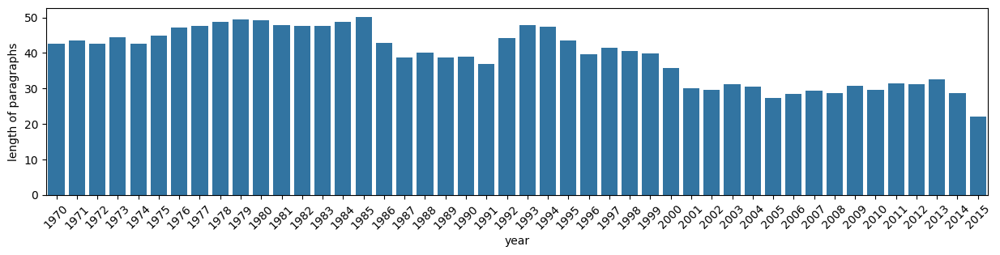

In [25]:
plt.figure(figsize=(15,3))
sns.barplot(data=main_df.groupby('year')['number_of_paragrafhs'].mean())
plt.xticks(rotation=45)
plt.xlabel('year')
plt.ylabel('length of paragraphs')



In [26]:
# vectorize

In [27]:
pip install spacy

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1.2 -> 25.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [28]:
from sklearn.feature_extraction.text import TfidfVectorizer
from spacy.lang.en.stop_words import STOP_WORDS as stopwords

In [29]:
#calculate the document-term matrix for the speeches

#TEAMS what do these arguments do? min_df = 5 and max_df = 0.7
# min_df ignores words that appear in fewer than 5 documents
# max_df ignores words that appear in more than 70% of documents
#min_df = çok az geçenleri at mesela en az 5 dokumanda gecmeyeni alma gibi
#max_df = çok fazla geçenleri at
# vectorizer’lar (CountVectorizer / TfidfVectorizer)
#stop_words’u LİSTE veya SET olarak bekler.

In [30]:

Tfidf_text_vectorizer =TfidfVectorizer(stop_words= list(stopwords),min_df=5,max_df=0.7)
Tfidf_text_vectors = Tfidf_text_vectorizer.fit_transform(main_df['text'])

Tfidf_text_vectors.shape

(7507, 24611)

In [31]:
'''
stop_words=list(stopwords)
→ “the, is, and” gibi anlam taşımayan kelimeleri sil
min_df=5
→ “çok nadir geçenleri sil”
max_df=0.7
→ “çok yaygın geçenleri sil”
'''

'\nstop_words=list(stopwords)\n→ “the, is, and” gibi anlam taşımayan kelimeleri sil\nmin_df=5\n→ “çok nadir geçenleri sil”\nmax_df=0.7\n→ “çok yaygın geçenleri sil”\n'

In [32]:
main_df.columns

Index(['session', 'year', 'country', 'text', 'paragh', 'number_of_paragrafhs'], dtype='object')

In [33]:
# if i: bu statment i degeri var mi diye bakiyo
paragraf_df = pd.DataFrame([{'text': i,'year' : year}
              for parag,year in zip(main_df['paragh'],main_df['year'])for i in parag if i])
#burda parag main df den tek tek aldigi kolon



In [34]:
paragraf_df

,text,year
0,﻿It is indeed a pleasure for me and the member...,1989
1,My delegation associates itself with previous ...,1989
2,"As in previous years, my delegation wishes to ...",1989
3,Today we find ourselves at an important crossr...,1989
4,"Developments in southern Africa, and more part...",1989
...,...,...
282205,"In the meantime, the developed countries and t...",2001
282206,"Most recently, Kuwait has contributed $1 milli...",2001
282207,"On a parallel track, Kuwait is contributing to...",2001
282208,Let me close by saying that we look forward to...,2001


In [35]:
paragraf_df['text'].head(3)

0    ﻿It is indeed a pleasure for me and the member...
1    My delegation associates itself with previous ...
2    As in previous years, my delegation wishes to ...
Name: text, dtype: object

In [36]:
#create another vectorized model for the paragraphs
tfidf_para_vectorizer = TfidfVectorizer(stop_words=list(stopwords),min_df=5,max_df=0.7)
tfidf_para_vectors = tfidf_para_vectorizer.fit_transform(paragraf_df['text'])

In [37]:
tfidf_para_vectors.shape

(282210, 25165)

In [38]:
#1. yi yapma sebebimiz
#Büyük resmi görmek için
#Yıllara göre konuşmalar nasıl değişmiş?
#Genel topic’ler neler?
############NEYİ CEVAPLAR?#########
#“Bu konuşma genel olarak ne hakkında?”
############AVANTAJ#################
#Daha temiz
#Daha az gürültü
#Yorumlamak kolay
##########DEZAVANTAJ##############
#Konuşma içindeki farklı konular karışır

In [39]:
#NEYİ TEMSİL EDİYOR?
#1 satır = 1 paragraf
#Konuşma parçalara ayrılmış
#########NEDEN YAPTIK?
#Aynı konuşmada birden fazla konu var
#Detayı kaçırmamak için
#Topic’leri daha net ayırmak için
#####NEYİ CEVAPLAR?
#“Bu paragraf ne hakkında?”
#####AVANTAJ
#Daha detaylı analiz
#Topic separation çok daha net
######DEZAVANTAJ
#Gürültü artar
#Daha fazla veri → daha karmaşık

In [40]:
# Önce genel temaları yakalamak için konuşmaların tamamını vektörleştirdik,
# ardından her konuşma içindeki daha ince ve detaylı konuları analiz edebilmek için paragrafları vektörleştirdik.

In [41]:
# V (document–term matrix)
# W (document–topic matrix)
# NMF is an unsupervised technique used to extract latent topics from text by factorizing the TF-IDF matrix.

In [42]:
from sklearn.decomposition import NMF

In [43]:
nmf_text_model = NMF(n_components=6,random_state=46)
# n_components = topic
w_text_matrix = nmf_text_model.fit_transform(Tfidf_text_vectors) # “TF-IDF ile sayıya çevirdiğim metinleri al, bunları 10 topic’e böl.”
h_text_matrix = nmf_text_model.components_ # “Bu kelime bu topic için ne kadar önemli?”


In [44]:
w_text_matrix.shape

(7507, 6)

In [45]:
h_text_matrix.shape

(6, 24611)

In [46]:
#Topics are word distributions, so let's analyze this ditribution and see whether any interpretations jump out at us.
# enumerate, bir şeyin hem indeksini (sıra numarasını) hem de değerini aynı anda verir.
#no_top_words bu kac satir gosericegiin
#argsort, bir diziyi sıraladığında elemanların hangi index sırasıyla geleceğini döndürür.


In [47]:
def display_topics(model,features,no_top_words=3):
    for topic,word in enumerate(model.components_):
        total = word.sum()
        largest = word.argsort()[::-1] # invert sort order
        print(f'\ntopic {topic}')
        for i in range(0,no_top_words):
            print(f"{features[largest[i]]} ({word[largest[i]]*100/total:.2f})")



In [48]:
#Pizza yapımı kolay konu ozeti
#Yazılar = karışık malzeme
#NMF = usta
#H = “Bu pizza mantarlı mı?”
#W = “Bu müşteri hangisini seviyor?”
#Usta pizzayı yapmak için:
#hem malzemeye bakar
#hem müşteriye
#Ama sen sadece diyorsun ki:
#“Bana pizzanın adını söyle”
###################### 
# Makine W ve H’yi birlikte öğrenir
#H modelin içinde kalır
#W sana verilir
#Sen sadece H’ye bakarsın

In [49]:
display_topics(nmf_text_model,Tfidf_text_vectorizer.get_feature_names_out())


topic 0
nuclear (0.60)
co (0.56)
operation (0.48)

topic 1
cooperation (0.33)
terrorism (0.29)
reform (0.26)

topic 2
africa (0.93)
african (0.63)
south (0.57)

topic 3
arab (0.96)
israel (0.83)
palestinian (0.57)

topic 4
american (0.27)
latin (0.26)
america (0.26)

topic 5
pacific (0.73)
island (0.65)
small (0.59)


In [50]:
#Hangi topic ne kadar BÜYÜK?”
# axis = 0 yan yana toplama
# we can find out how "big" a topic is:
np.round(w_text_matrix.sum(axis=0)/w_text_matrix.sum()*100)

array([15., 25., 18., 13., 18., 12.])

In [51]:
#1.yaptigimiz ana konu ana basliklar
#fidf_text_vectors = her satır 1 konuşma (uzun metin)
#NMF burada şunu bulur:
#“Genel olarak konuşmalar hangi büyük temalar etrafında?”
#Büyük temalar: ekonomi, savaş, sağlık, eğitim vs.

In [52]:
#2. yaptigimizt fidf_para_vectors = her satır 1 paragraf (kısa metin)
#NMF burada şunu bulur:
#“Paragraflar tek tek ne hakkında?”
#“Konuşmanın içindeki alt konular neler?”
# Daha net, daha “keskin” topic’ler çıkar.

In [53]:
nmf_para_model=NMF(n_components=6,random_state=46)
w_para_matrix = nmf_para_model.fit_transform(tfidf_para_vectorizer.fit_transform(paragraf_df['text']))
h_para_matrix = nmf_para_model.n_components_

In [54]:
display_topics(nmf_para_model,tfidf_para_vectorizer.get_feature_names_out())


topic 0
nations (3.53)
united (3.43)
organization (0.98)

topic 1
general (2.80)
session (2.75)
assembly (2.75)

topic 2
countries (1.68)
development (1.33)
economic (1.30)

topic 3
peace (1.06)
people (0.88)
security (0.66)

topic 4
nuclear (4.35)
weapons (2.90)
disarmament (1.82)

topic 5
rights (5.02)
human (4.81)
respect (0.94)


In [55]:
##### opic modeling NMF ile olur ama başka bir yol daha var: SVD (LSA)
#SVD ne yapıyor?
#SVD diyor ki:
#“Bu büyük, karmaşık tabloyu
#3 tane daha basit tabloya ayırabilirim
# V = (dokümanlar) × (önemler) × (kelimeler)
# LSA, kelime kelime değil
#anlam anlam yakalamak için kullanılır.

In [56]:
from sklearn.decomposition import TruncatedSVD

In [57]:
svd_para_model = TruncatedSVD(n_components=5,random_state=46)

w_para_matrix = svd_para_model.fit_transform(tfidf_para_vectors)  
h_para_matrix = svd_para_model.components_                        

In [58]:
h_para_matrix.shape

(5, 25165)

In [59]:
w_para_matrix.shape

(282210, 5)

In [60]:
display_topics(svd_para_model,tfidf_para_vectorizer.get_feature_names_out())


topic 0
nations (0.67)
united (0.65)
international (0.58)

topic 1
general (-14.24)
assembly (-13.27)
session (-13.10)

topic 2
countries (18.89)
development (14.39)
economic (13.68)

topic 3
nations (-4.38)
united (-4.03)
development (-0.95)

topic 4
nuclear (-21.60)
weapons (-14.32)
disarmament (-9.28)


In [61]:
#LDA, “dokümanlar nasıl yazılırdı?” diye düşünüp
#oradan topic’leri bulan
#olasılıksal ama pahalı bir yöntemdir.

Latent Dirichlet Allocation

LDA is maybe the most prominent method for topic modeling in use today, largely popularized over the last ~15 years and flexibly adaptable to many different usage scenarios.

LDA views each document as consisting of different topics, i.e. each document is a mix of different topics, and the topics are mixed from words[??]. To keep the number of topics-per-document low and to keep only the important words constituting the topics, LDA initially uses a Dirichlet distribution called a Dirichlet prior. This is for both assigning topics to documents and for finding words for a topic.

The Dirichlet distribution ensures documents have only a small number of topics and that topics are mainly defined by a small number of words. Assuming LDA generated topic words like the previous ones, a topic could be made of words like nuclear, treaty, and disarmament.

The generative process starts after the initial assignments. It uses the Dirichlet distribution for topics and words and tries to recreate words from the original documents with stochastic sampling. The process is computationally intensive because it needs to be iterated many time. On the other hand, the results can be used to generate documents for any identified topic.

Blueprint: Creating a Topic Model for Paragraphs with LDA

sklearn uses the same API as the other topic modeling methods:

In [62]:
#CountVectorizer kullandık çünkü LDA,
#kelimeleri ağırlıkla değil
#SAYIYLA öğrenir.

In [63]:
#Model	  Vectorizer
#NMF	   TF-IDF 
#SVD	   TF-IDF 
#LDA 	  CountVectorizer 

In [64]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.decomposition import LatentDirichletAllocation

In [65]:
count_text_vectorizer = CountVectorizer(stop_words=list(stopwords),min_df=5,max_df=0.7)
count_text_vectors = count_text_vectorizer.fit_transform(main_df['text'])

In [66]:
pd.DataFrame(count_text_vectors.toarray(),columns=count_text_vectorizer.get_feature_names_out())

,00,000,001,007,01,02,03,05,06,08,09,10,100,1000,100th,101,1013,10191,101st,102,10217,103,104,105,106,107,1073,108,109,10th,11,110,111,112,1127,113,114,115,116,117,1173,118,119,1192,1199,11th,12,120,121,122,123,124,1244,125,126,1264,1267,127,1278,128,1284,129,12th,13,130,131,132,1325,133,134,1343,135,136,1368,137,1373,1378,138,139,1397,13th,14,140,1402,141,1419,142,143,144,145,146,147,148,1483,149,1492,1493,1497,14th,15,150,1500,150th,151,1514,1515,152,153,154,1540,1541,1546,155,156,1564,157,158,158th,159,159th,15th,16,160,160th,161,162,1624,163,164,165,166,1661,167,168,169,1695,1696,16th,17,170,1701,1706,171,172,1721,173,174,175,1754,176,1769,177,1770,1776,1778,178,1789,179,17982,17th,18,180,1804,181,1810,1815,182,1820,1821,1825,1826,183,1833,184,1841st,1842nd,1847,185,1851st,1855th,1859,185th,186,1860,1862,187,1874,1879,188,1884,1885,1887,1889,189,1896,1897,1898,1899,189th,18th,19,190,1900,1901,1902,1903,1904,1905,1907,1908,190th,191,1910,1912,1914,1915,1917,1918,1919,191st,192,1920,1920s,1921,1922,1923,1925,1926,1928,1929,192nd,193,1930,1930s,1931,1932,1933,1934th,1935,1936,1937,1938,1939,193rd,194,1940,1940s,1941,1942,1942nd,1943,1944,1944th,1945,1946,1946th,1947,1948,1949,195,1950,1950s,1950th,1951,1952,1953,1954,1955,1956,1957,1958,1959,196,1960,1960s,1961,1962,1963,1964,1965,1966,1967,1968,1969,197,1970,1970s,1971,1972,1973,1974,1975,1976,1977,1978,1979,198,1980,19808,1980s,1981,1982,1983,1984,1985,1986,1987,1988,1989,199,1990,19908,1990s,1991,1992,1993,1994,1995,1996,1997,1998,1999,19th,1j,1st,20,200,2000,2001,2002,2003,2004,2005,2006,2007,2008,2009,200th,201,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,202,2020,2021,2022,2023,2024,2025,203,2030,2032nd,2035,2038th,2039,204,2041st,2042nd,2045th,205,2050,2050th,206,2063,2065,2066,207,208,209,20s,20th,21,210,2100,2106,211,2117th,2118,2119th,212,2124th,2126th,2128th,213,214,2140th,2145,215,216,2165,217,2177,2178,218,219,21st,22,220,2200,221,2216,222,2222,223,2233rd,2234th,2238th,2239th,224,2240th,2248th,2249th,225,2252nd,226,227,228,229,22nd,23,230,231,232,233,234,235,2355th,2357th,236,237,2373,238,239,24,240,241,242,243,244,245,246,247,248,249,25,250,2505,251,252,253,2535,254,255,256,257,2574,258,259,25th,26,260,2602,261,262,2621,2625,2626,2627,263,264,265,266,2660,267,2672,268,269,27,270,271,272,273,2734,274,2749,275,2750,2758,276,277,278,279,27th,28,280,281,282,2826,283,2832,2833,284,285,286,287,288,289,28th,29,290,291,292,293,2930,2936,294,29431,29437,295,29562,29568,29595,296,29658,29664,297,29701,298,29816,29822,29876,299,2992,29940,29946,2j,2nd,30,300,301,3010,302,3029,303,3034,304,305,306,3068,307,308,309,3093,30th,31,310,3100,311,3111,311197,312,313,314,315,316,3160,317,318,319,32,320,3201,3202,3207,321,3210,3212,322,323,3236,3237,324,325,326,327,328,3281,329,33,330,331,3311,3314,332,333,334,3349,335,336,3362,3366,337,3376,3379,338,3385,339,3390,3395,34,340,341,342,343,344,345,3458,346,347,348,349,35,350,351,352,353,354,355,356,357,358,359,36,360,361,362,363,364,365,366,367,368,369,37,370,371,372,373,374,375,376,377,378,379,38,380,381,382,383,384,385,386,387,388,389,39,390,391,392,393,394,395,396,397,398,399,3rd,3us,40,400,401,402,403,404,405,406,407,408,409,40th,41,410,411,412,413,414,415,416,417,418,419,42,420,421,423,425,426,427,428,43,431,432,433,435,436,437,439,43s,44,440,441,447,448,45,450,456,457,46,460,461,462,464,465,47,470,476,478,479,48,487,49,490,497,4s,4th,50,500,502,503,50692,50702,508,50847,50865,50871,509,51,51185,51191,51197,512,51226,513,51360,51372,51378,51384,51390,51398,514,51570,51606,51670,51681,51749,51839,51845,51851,52,520,521,52179,522,52228,52265,52272,523,52320,52425,52463,52470,52586,52592,52598,52604,52731,52737,52879,52885,52988,53,530,53005,53122,53129,53135,53141,53165,532,53317,53323,53329,53341,534,53609,53615,539,53952,53958,54,540,541,54827,54833,54959,54965,55,550,55103,55109,55122,55128,552,55264,55276,55396,554,55408,555,557,56,560,565,567,569,57,570,571,572,58,582,583,587,59,590,598,5th,60,600,601,61,6191,62,620,621,6

In [67]:
lda_text_model = LatentDirichletAllocation(n_components = 5 ,random_state = 46)
w_lda_text_matrix = lda_text_model.fit_transform(count_text_vectors)
h_lda_text_matrix = lda_text_model.components_

In [68]:
display_topics(lda_text_model,Tfidf_text_vectorizer.get_feature_names_out())


topic 0
cooperation (0.45)
africa (0.41)
challenges (0.39)

topic 1
cooperation (0.42)
terrorism (0.41)
european (0.39)

topic 2
nuclear (0.74)
co (0.65)
operation (0.57)

topic 3
america (0.37)
central (0.29)
american (0.29)

topic 4
africa (0.86)
arab (0.60)
south (0.56)


In [69]:
pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable

[notice] A new release of pip is available: 23.1.2 -> 25.3
[notice] To update, run: pip install --upgrade pip
Note: you may need to restart the kernel to use updated packages.


In [70]:
from wordcloud import WordCloud

In [71]:
def wordcloud_topics(model, features, no_top_words=40):
    for topic, words in enumerate(model.components_):
        size = {}
        largest = words.argsort()[::-1] #sort inverse order

        for i in range(0, no_top_words):
            size[features[largest[i]]] = abs(words[largest[i]])

        wc = WordCloud(max_words=100, background_color='white',width=960,height=540)
        wc.generate_from_frequencies(size)

        plt.figure(figsize=(4,3))
        plt.imshow(wc, interpolation='bilinear')
        plt.axis('off')

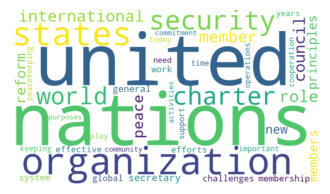

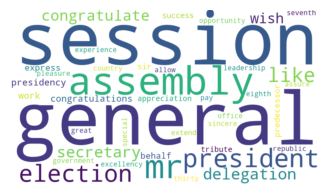

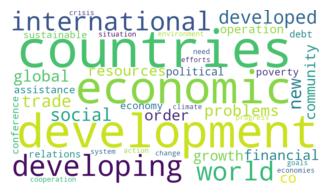

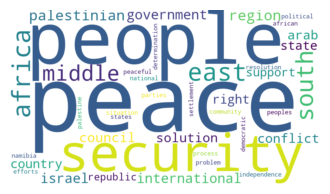

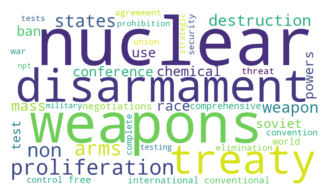

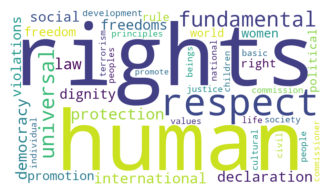

In [72]:
wordcloud_topics(nmf_para_model, tfidf_para_vectorizer.get_feature_names_out())